In [2]:
import numpy as np
import pandas as pd
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.serialize import model_to_json, model_from_json
import json
from sklearn import metrics

In [5]:
data = pd.read_csv("msa_merged_data.csv")
data["BEGIN_DATE_GMT"] = pd.to_datetime(data["BEGIN_DATE_GMT"])

with open('prophet_model_pre_2020.json', 'r') as fin:
    prop_m = model_from_json(json.load(fin))  # Load model

In [22]:
# Functions to make FBProphet Datasets
def make_prophet_df(X, y, regressors):
    data = pd.DataFrame()
    data["y"] = y
    data['ds'] = X["BEGIN_DATE_GMT"]
    for i in regressors:
        data[i] = X[i]
    return data

def make_future_df(prophet_model, df_train, df_test,include_history):
    # Creating the dataframe with datetime values to predict on (making predictions on train as well as the test set)
    future_dates = prophet_model.make_future_dataframe(periods=len(df_test), freq='H', include_history= include_history)
    # Adding regressors 
    if include_history:
        future_dates = pd.merge(future_dates, (df_train.append(df_test)).drop('y', axis=1), on = 'ds')
    else:
        future_dates = pd.merge(future_dates, df_test.drop('y', axis=1), on = 'ds')

    return future_dates

# X-y split
y = data["AIL_DEMAND"]
X = data.drop(columns = ["AIL_DEMAND"])

#Regressors
regressors = ["POOL_PRICE", "Weighted_Avg_Temp", "workingday"]

# Spliting train and test set
split_index = data[data["BEGIN_DATE_GMT"] ==  "2020-01-01 00:00:00"].index[0]
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

prop_train = make_prophet_df(X_train,y_train, regressors)
# Predicting the future
prop_test = make_prophet_df(X_test, y_test, regressors)

# Creating the dataframe with datetime values to predict on (making predictions on train as well as the test set)
future_dates = make_future_df(prop_m, prop_train, prop_test, include_history=False)
prop_forecast = prop_m.predict(future_dates)

In [28]:
ev = metrics.explained_variance_score( prop_test["y"], prop_forecast["yhat"]) * 100
sk_mape = metrics.mean_absolute_error( prop_test["y"], prop_forecast["yhat"])

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
mape = mean_absolute_percentage_error( prop_test["y"], prop_forecast["yhat"])

print("Explained Variance: ", ev, "%", " \nMean Aboslute Perc. Error:", mape, "%")

Explained Variance:  83.35495758329473 %  
Mean Aboslute Perc. Error: 3.5039167685291273 %


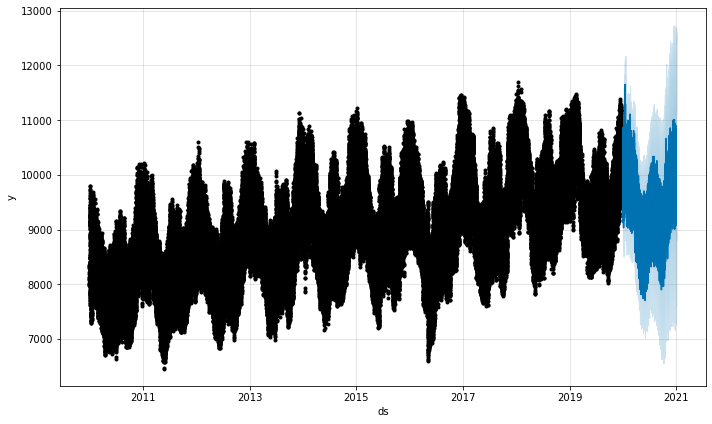

In [30]:
_ = prop_m.plot(prop_forecast)

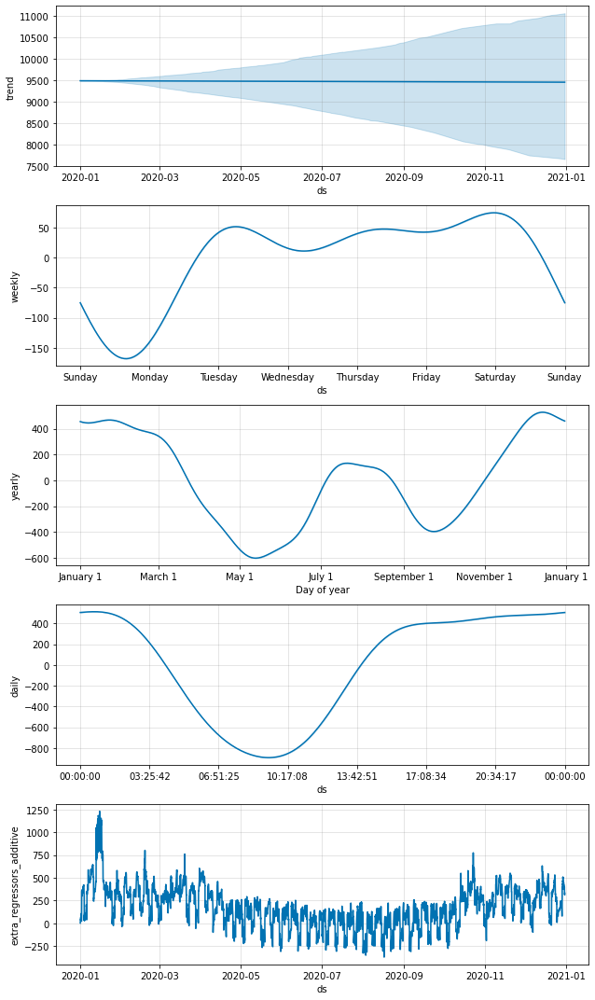

In [31]:
_ = prop_m.plot_components(prop_forecast)